## LINEAR REGRESSION

#IMPORTING LIBRARIES

In [1]:
import pandas as pd
import seaborn as sns
import statsmodels.formula.api as smf
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import zscore
from matplotlib.pyplot import figure
from sklearn.metrics import r2_score,mean_squared_error

#IMPORTING DATA

In [2]:
data= pd.read_csv('Engineering_graduate_salary.csv',index_col=0)
data

,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,...,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Salary
ID,,,,,,,,,,,,,,,,,,,,,
604399,f,1990-10-22,87.80,cbse,2009,84.00,cbse,6920,1,B.Tech/B.E.,...,-1,-1,-1,-1,-0.1590,0.3789,1.2396,0.14590,0.2889,445000
988334,m,1990-05-15,57.00,cbse,2010,64.50,cbse,6624,2,B.Tech/B.E.,...,-1,-1,-1,-1,1.1336,0.0459,1.2396,0.52620,-0.2859,110000
301647,m,1989-08-21,77.33,"maharashtra state board,pune",2007,85.17,amravati divisional board,9084,2,B.Tech/B.E.,...,-1,-1,260,-1,0.5100,-0.1232,1.5428,-0.29020,-0.2875,255000
582313,m,1991-05-04,84.30,cbse,2009,86.00,cbse,8195,1,B.Tech/B.E.,...,-1,-1,-1,-1,-0.4463,0.2124,0.3174,0.27270,0.4805,420000
339001,f,1990-10-30,82.00,cbse,2008,75.00,cbse,4889,2,B.Tech/B.E.,...,-1,-1,-1,-1,-1.4992,-0.7473,-1.0697,0.06223,0.1864,200000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103174,f,1989-04-17,75.00,0,2005,73.00,0,1263,2,B.Tech/B.E.,...,-1,-1,-1,-1,-1.1901,0.9688,-1.0697,1.35490,0.0284,120000
352811,f,1991-07-22,84.00,state board,2008,77.00,state board,9481,2,B.Tech/B.E.,...,-1,-1,-1,-1,-0.1082,0.0328,-0.4891,-0.29020,0.5024,120000
287070,m,1988-11-24,91.40,bsemp,2006,65.56,bsemp,547,2,B.Tech/B.E.,...,-1,-1,-1,-1,-0.8810,0.1888,-0.3440,0.06230,0.6603,385000


#CHECKING IF THERE ARE ANY MISSING VALUES

In [3]:
data.isna().sum()

Gender                   0
DOB                      0
10percentage             0
10board                  0
12graduation             0
12percentage             0
12board                  0
CollegeID                0
CollegeTier              0
Degree                   0
Specialization           0
collegeGPA               0
CollegeCityID            0
CollegeCityTier          0
CollegeState             0
GraduationYear           0
English                  0
Logical                  0
Quant                    0
Domain                   0
ComputerProgramming      0
ElectronicsAndSemicon    0
ComputerScience          0
MechanicalEngg           0
ElectricalEngg           0
TelecomEngg              0
CivilEngg                0
conscientiousness        0
agreeableness            0
extraversion             0
nueroticism              0
openess_to_experience    0
Salary                   0
dtype: int64

In [4]:
for i in range(data.shape[1]):
  print(data.iloc[:,i].unique())

['f' 'm']
['1990-10-22' '1990-05-15' '1989-08-21' ... '1985-02-23' '1986-02-08'
 '1988-11-24']
[87.8  57.   77.33 84.3  82.   83.16 72.5  77.   76.8  81.2  85.   90.
 86.4  84.13 81.7  86.   66.15 79.29 60.   58.4  61.   50.   67.06 67.
 73.   86.17 78.   71.8  66.66 83.6  61.69 80.13 82.5  63.5  64.   76.
 91.   65.   70.16 74.6  66.5  78.4  62.   52.93 70.2  93.   53.4  84.2
 71.5  81.5  63.   74.   91.6  87.5  78.5  79.5  71.   66.   89.44 90.33
 76.5  70.   89.5  56.4  88.67 58.33 85.92 88.8  73.8  81.4  88.1  82.3
 66.7  72.   58.56 58.   75.6  75.   92.2  84.5  89.4  76.2  85.33 45.6
 86.5  75.83 69.4  85.6  80.6  69.   89.56 83.2  51.   60.7  90.6  75.4
 81.8  75.85 89.2  93.8  76.66 90.4  90.8  82.67 94.16 61.73 87.7  88.
 80.8  77.6  87.   89.8  80.   84.   89.6  59.57 83.   67.8  82.4  79.
 73.5  89.   87.4  93.33 71.3  81.   55.   83.4  64.8  83.5  82.27 71.1
 91.4  87.33 73.94 79.8  92.   78.93 52.7  69.5  67.25 88.2  67.2  56.
 90.2  83.68 84.4  85.8  83.04 79.2  77.86 81.

In [5]:
for i in range(data.shape[1]):
  print(data.iloc[:,i].value_counts())

m    2282
f     716
Name: Gender, dtype: int64
1991-07-03    7
1991-07-31    6
1990-12-10    6
1990-10-07    6
1990-08-08    6
             ..
1991-04-23    1
1991-07-10    1
1990-03-03    1
1987-04-15    1
1988-11-24    1
Name: DOB, Length: 1633, dtype: int64
78.00    60
76.00    53
80.00    52
87.00    51
82.00    51
         ..
77.53     1
61.30     1
72.83     1
77.65     1
69.30     1
Name: 10percentage, Length: 736, dtype: int64
cbse                            1026
state board                      881
0                                256
icse                             213
ssc                               96
                                ... 
maharashtra state board,pune       1
up board , allahabad               1
mirza ahmed ali baig               1
aurangabad board                   1
karnataka education board          1
Name: 10board, Length: 221, dtype: int64
2009    793
2008    702
2010    548
2007    394
2006    311
2005    127
2004     54
2011     31
2003     17
2002 

#DATA CLEANING

Replacing male with 0 and female with 1

In [6]:
data["Gender"] = data["Gender"].replace({'m': 0, 'f': 1})

Replacing -1 with 0 because -1 indictes that a person didn't appear for the exam

In [7]:
data.replace(to_replace=-1, value=0,inplace=True)

Checking outliers for the target column

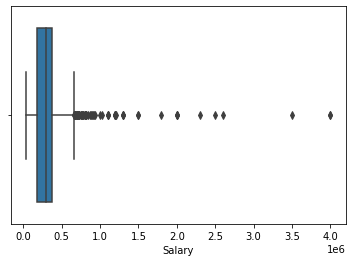

In [8]:
 sns.boxplot(x=data.Salary)

Removing outliers using inter-quartile range

In [9]:
q3 = data['Salary'].quantile(.75)
q1 = data['Salary'].quantile(.25)
iqr = q3-q1
iqr

190000.0

In [10]:
upperrange = q3+1.5*iqr
bottomrange = q1-1.5*iqr
data = data[(data['Salary']>bottomrange) & (data['Salary']<upperrange)] 

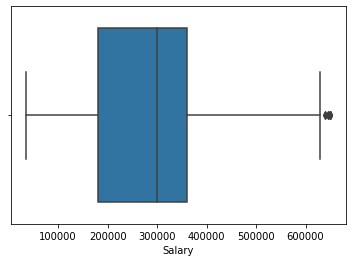

In [11]:
sns.boxplot(x=data.Salary)

#EDA (Exploratory Data Analysis)

##Bar Plot

Who(male/female) is earning much salary

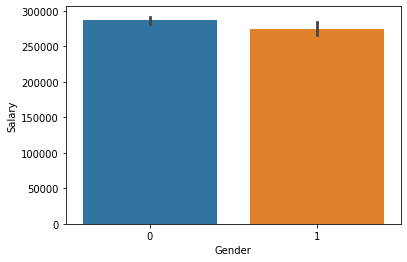

In [12]:
sns.barplot(x='Gender',y='Salary',data=data)

Counting the specialization
---We can see that electronics and communication engineering is most opted specialization

In [13]:
data['Specialization'].value_counts()

electronics and communication engineering      658
computer science & engineering                 547
information technology                         497
computer engineering                           392
computer application                           195
electronics and electrical engineering         146
mechanical engineering                         145
electronics & telecommunications                89
electrical engineering                          62
electronics & instrumentation eng               23
electronics and instrumentation engineering     18
information science engineering                 18
instrumentation and control engineering         16
civil engineering                               13
electronics engineering                         13
biotechnology                                   12
other                                           10
industrial & production engineering              7
chemical engineering                             5
mechanical and automation      

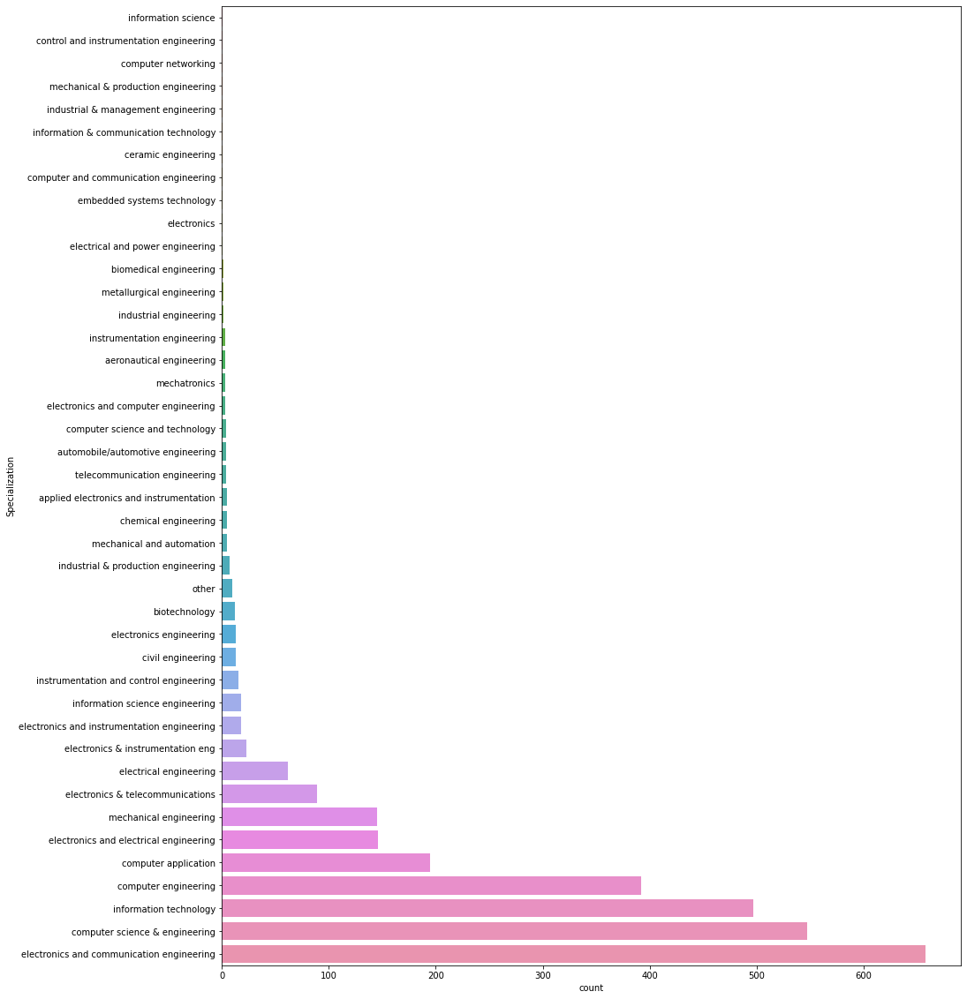

In [14]:
plt.figure(figsize = (15,20))
sns.countplot(y='Specialization',data=data,order=data['Specialization'].value_counts().sort_values().index)

counting the salary
---We can see that 300000 is earned by most of them

In [15]:
data['Salary'].value_counts()

300000    207
180000    189
200000    154
325000    134
120000    121
         ... 
144000      1
625000      1
580000      1
55000       1
575000      1
Name: Salary, Length: 123, dtype: int64

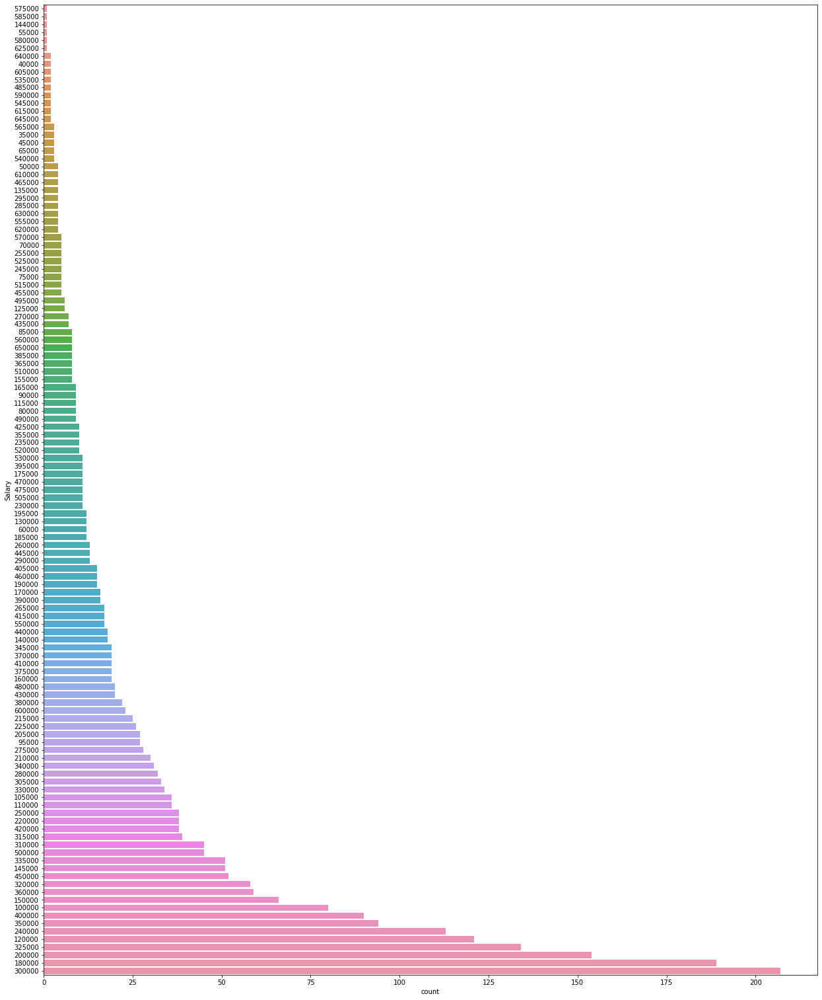

In [16]:
plt.figure(figsize = (21,27))
sns.countplot(y='Salary',data=data,order=data['Salary'].value_counts().sort_values().index)

Counting number of colleges located in each state
---We can see that Uttar Pradesh has more number of colleges

In [17]:
data['CollegeState'].value_counts()

Uttar Pradesh        677
Karnataka            274
Tamil Nadu           261
Telangana            242
Maharashtra          184
Andhra Pradesh       172
West Bengal          142
Madhya Pradesh       140
Punjab               136
Haryana              133
Orissa               128
Rajasthan            123
Delhi                116
Uttarakhand           77
Kerala                24
Chhattisgarh          17
Gujarat               16
Jharkhand             16
Himachal Pradesh      13
Bihar                  8
Union Territory        5
Jammu and Kashmir      5
Assam                  4
Sikkim                 2
Meghalaya              1
Goa                    1
Name: CollegeState, dtype: int64

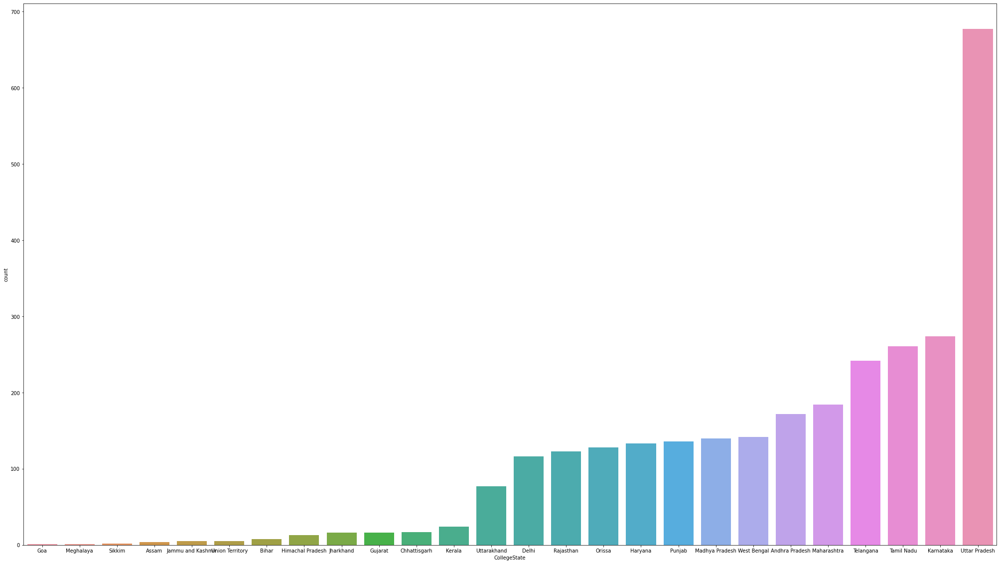

In [18]:
plt.figure(figsize = (35,20))
sns.countplot(x='CollegeState',data=data,order=data['CollegeState'].value_counts().sort_values().index)

Which specialization is earning much salary
----we can see that people who opted for computer networking are earning more

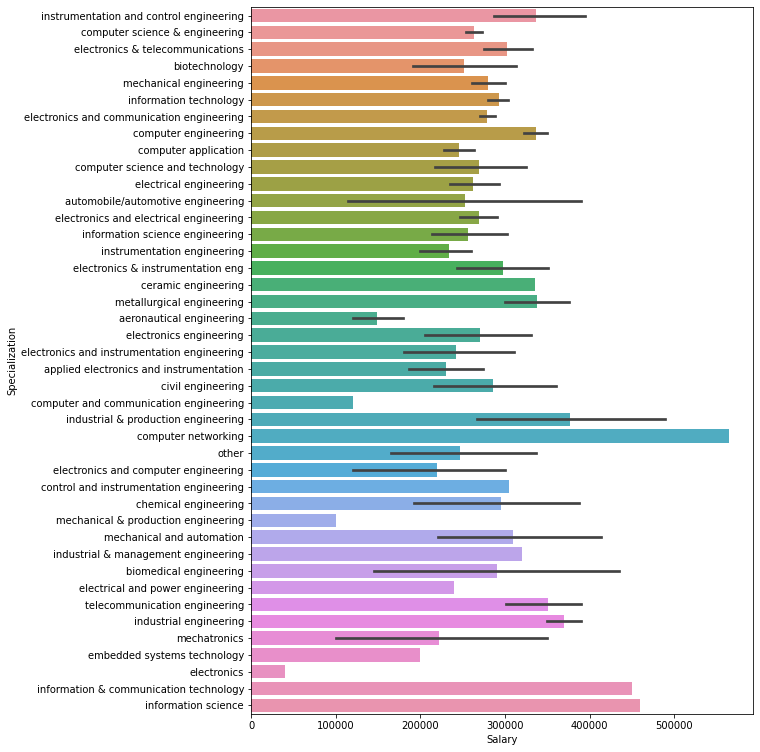

In [21]:
plt.figure(figsize = (9,13))
sns.barplot(y='Specialization',x='Salary',data=data)

For salary and degree
---Salary earned by M.Sc(Tech) is more compared to the other degree

In [22]:
data['Degree'].value_counts()

B.Tech/B.E.      2684
MCA               194
M.Tech./M.E.       38
M.Sc. (Tech.)       1
Name: Degree, dtype: int64

In [23]:
a=data.groupby('Degree')['Salary'].mean()

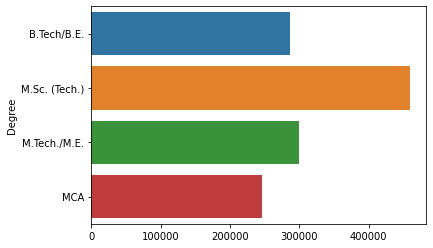

In [24]:
sns.barplot(x=a.values,y=a.index)

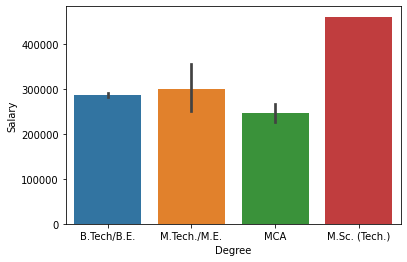

In [25]:
sns.barplot(x='Degree',y='Salary',data=data)

In [26]:
data['CollegeTier'].value_counts()

2    2715
1     202
Name: CollegeTier, dtype: int64

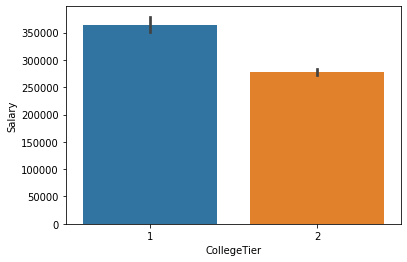

In [27]:
sns.barplot(x = 'CollegeTier', y ='Salary', data = data)

Which graduation year scored highest percentage in 12th
---We can see that 2011 and 2010 scored the highest percentage

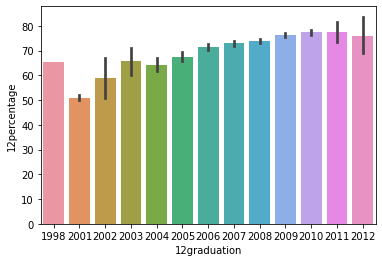

In [28]:
sns.barplot(x = '12graduation', y ='12percentage', data = data)

Which graduation year scored highest GPA in college

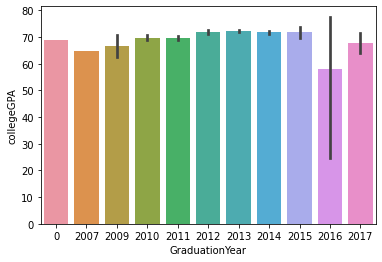

In [29]:
sns.barplot(x = 'GraduationYear', y ='collegeGPA', data = data)

What is the highest salary for each graduation Year
---In 2010 the highest salary is 350000 

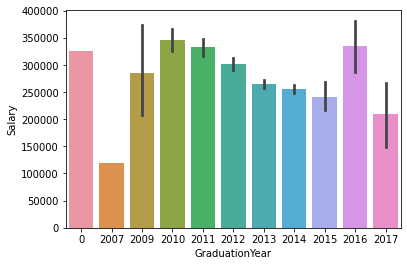

In [30]:
sns.barplot(x = 'GraduationYear', y ='Salary', data = data)

##kde Plot

In [31]:
data['10percentage'].value_counts()

78.00    59
76.00    52
72.00    51
86.00    51
87.00    51
         ..
72.75     1
70.75     1
91.62     1
79.29     1
69.30     1
Name: 10percentage, Length: 725, dtype: int64

What is the percentage scored by most of the students in 10th
---We can see that 78% is scored by most of the students

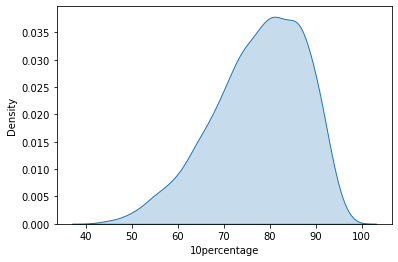

In [32]:
sns.kdeplot(data['10percentage'],shade=True);

What is the percentage scored by most of the students in 12th ---We can see that 72% is scored by most of the students

In [33]:
data['12percentage'].value_counts()

72.00    52
64.00    48
70.00    47
74.00    47
68.00    43
         ..
89.91     1
55.54     1
86.20     1
75.66     1
79.75     1
Name: 12percentage, Length: 703, dtype: int64

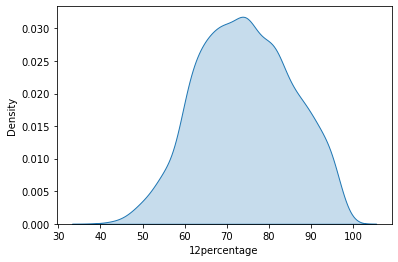

In [34]:
sns.kdeplot(data['12percentage'],shade=True);

What is the GPA scored by most of the students in college ---We can see that 72 GPA is scored by most of the students

In [35]:
data['collegeGPA'].value_counts()

72.00    81
70.00    73
75.00    66
65.00    61
76.00    57
         ..
78.36     1
72.25     1
65.47     1
72.90     1
73.19     1
Name: collegeGPA, Length: 1049, dtype: int64

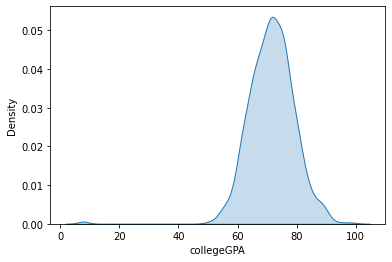

In [36]:
sns.kdeplot(data['collegeGPA'],shade=True);

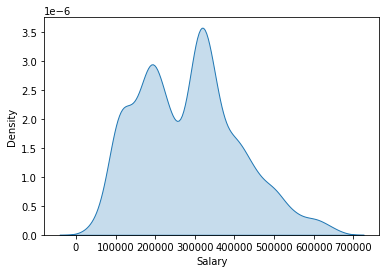

In [37]:
sns.kdeplot(data['Salary'],shade=True)

##Scatter Plot

What is the salary earned based on 10th percentage
---Students who scored 75%-100% are earning much salary

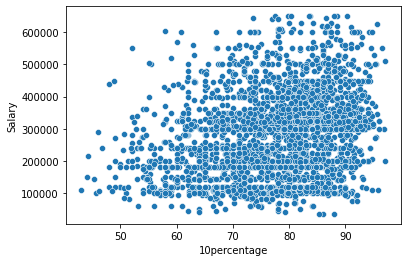

In [38]:
sns.scatterplot(x="10percentage",y="Salary",data=data)

What is the salary earned based on 12th percentage
---Students who scored 70%-100% are earning much salary

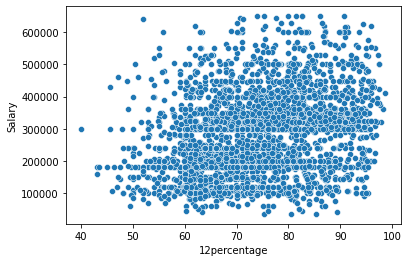

In [39]:
sns.scatterplot(x="12percentage",y="Salary",data=data)

What is the salary earned based on their college GPA
---Students who scored 65 GPA- 100 GPA are earning much salary

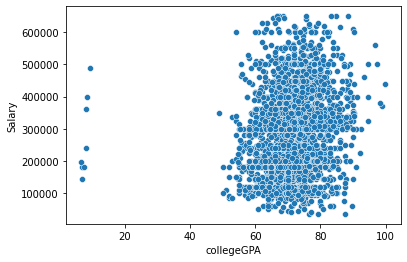

In [40]:
sns.scatterplot(x="collegeGPA",y="Salary",data=data)

Percentage scored in both 10th and 12th


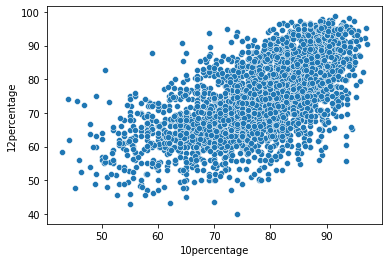

In [41]:
sns.scatterplot(x="10percentage",y="12percentage",data=data)

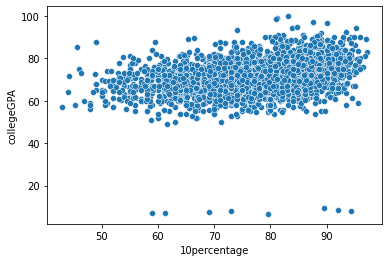

In [42]:
sns.scatterplot(x="10percentage",y="collegeGPA",data=data)

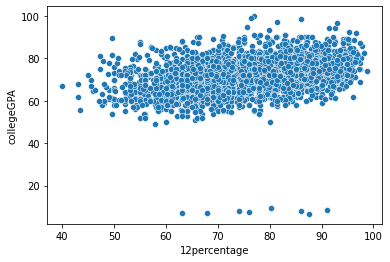

In [43]:
sns.scatterplot(x="12percentage",y="collegeGPA",data=data)

##Line Plot

Comparing Salary with scores from each AMCAT subject(English, Logical, Quant, Domain, ComputerProgramming, ElectronicsAndSemicon, ComputerScience, MechanicalEngg, ElectricalEngg, TelecomEngg, CivilEngg, conscientiousness, agreeableness, extraversion, nueroticism, openess_to_experience)

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


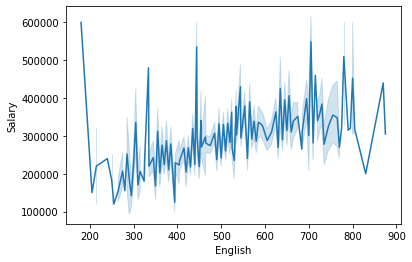

In [44]:
sns.lineplot('English', 'Salary', data=data);

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


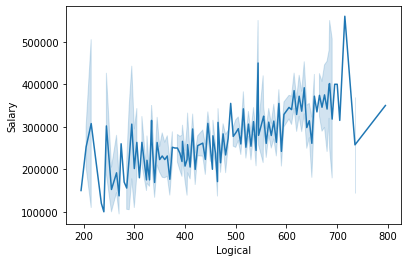

In [45]:
sns.lineplot('Logical', 'Salary', data=data);

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


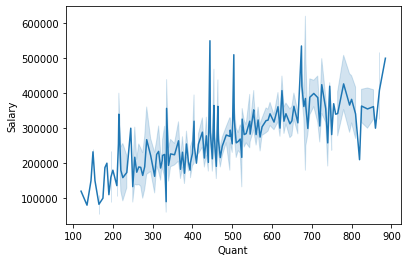

In [46]:
sns.lineplot('Quant', 'Salary', data=data);

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


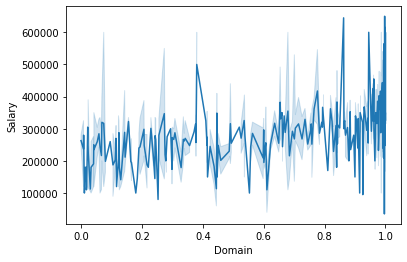

In [47]:
sns.lineplot('Domain', 'Salary', data=data);

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


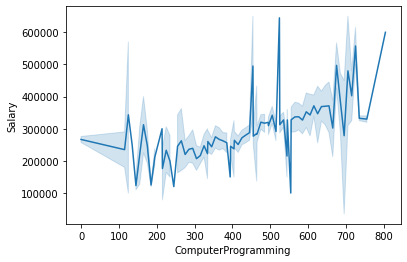

In [48]:
sns.lineplot('ComputerProgramming', 'Salary', data=data);

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


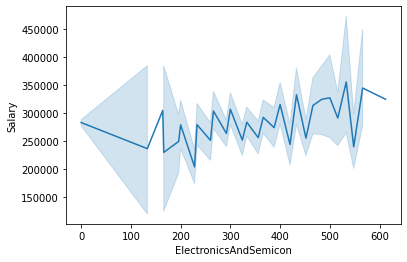

In [49]:
sns.lineplot('ElectronicsAndSemicon', 'Salary', data=data);

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


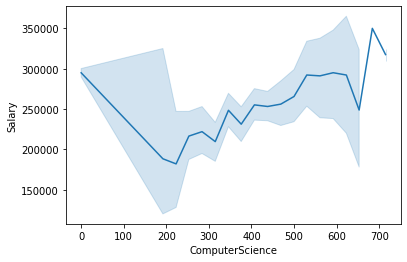

In [50]:
sns.lineplot('ComputerScience', 'Salary', data=data);

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


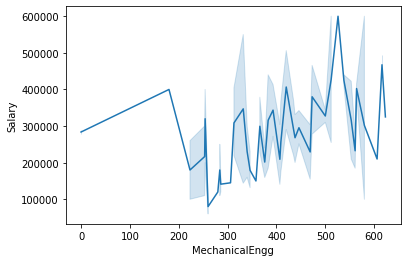

In [51]:
sns.lineplot('MechanicalEngg', 'Salary', data=data);

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


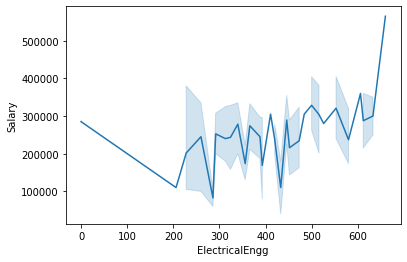

In [52]:
sns.lineplot('ElectricalEngg', 'Salary', data=data);

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


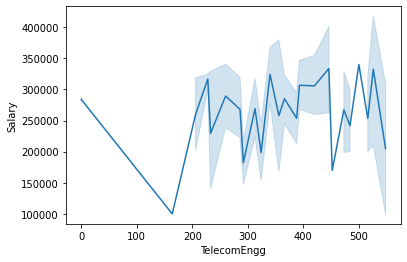

In [53]:
sns.lineplot('TelecomEngg', 'Salary', data=data);

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


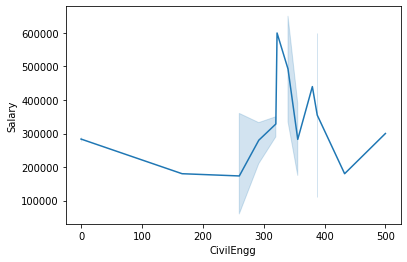

In [54]:
sns.lineplot('CivilEngg', 'Salary', data=data);

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


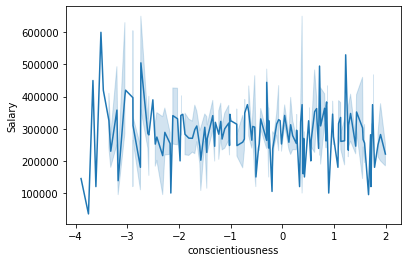

In [55]:
sns.lineplot('conscientiousness', 'Salary', data=data);

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


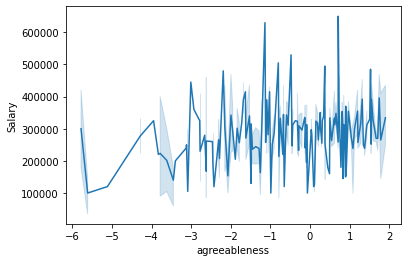

In [56]:
sns.lineplot('agreeableness', 'Salary', data=data);

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


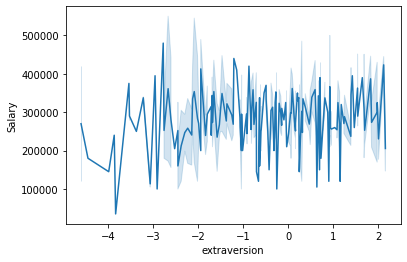

In [57]:
sns.lineplot('extraversion', 'Salary', data=data);

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


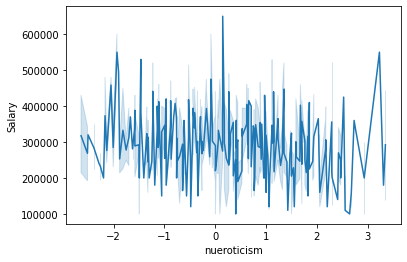

In [58]:
sns.lineplot('nueroticism', 'Salary', data=data);

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


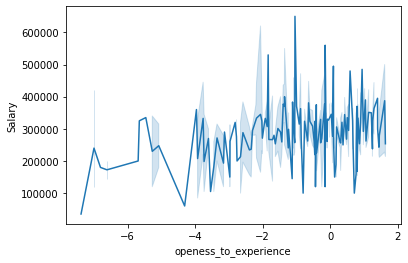

In [59]:
sns.lineplot('openess_to_experience', 'Salary', data=data);

##Pair plot

<Figure size 3600x3600 with 0 Axes>

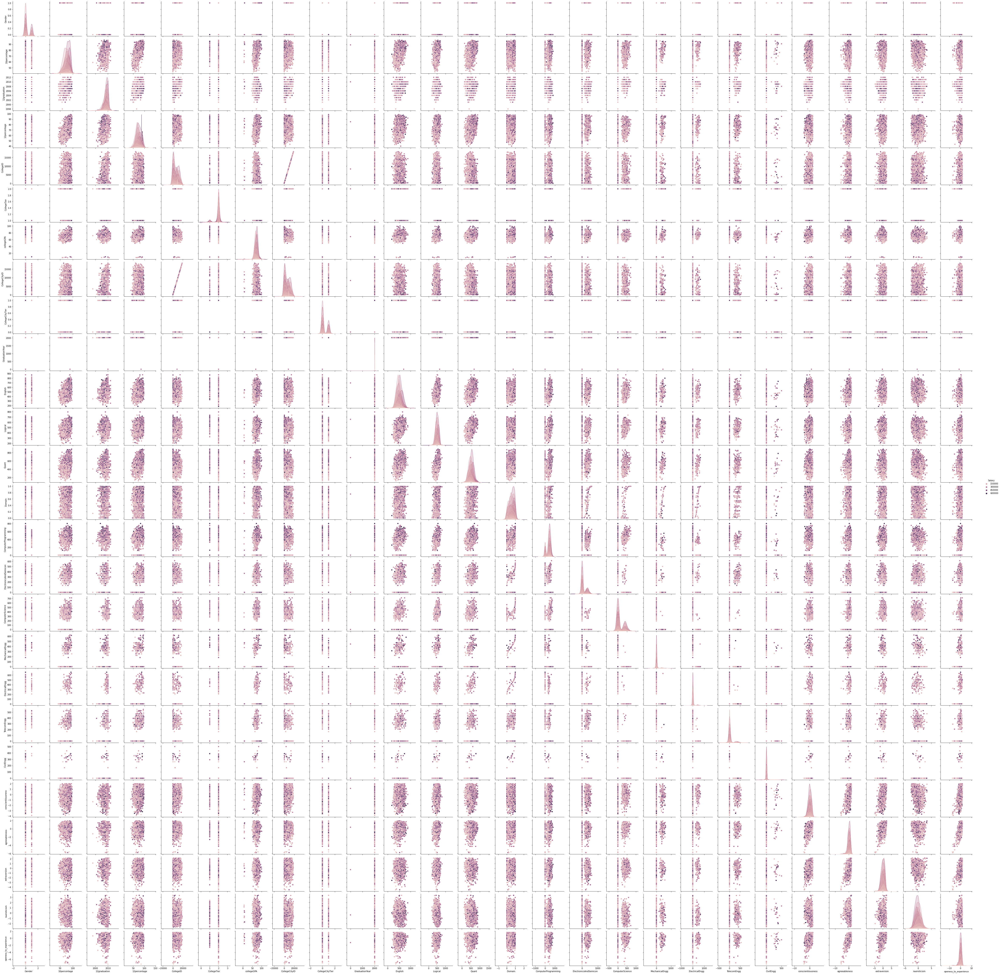

In [60]:
plt.figure(figsize = (50,50))
sns.pairplot(data,hue='Salary')

##Correlation plot

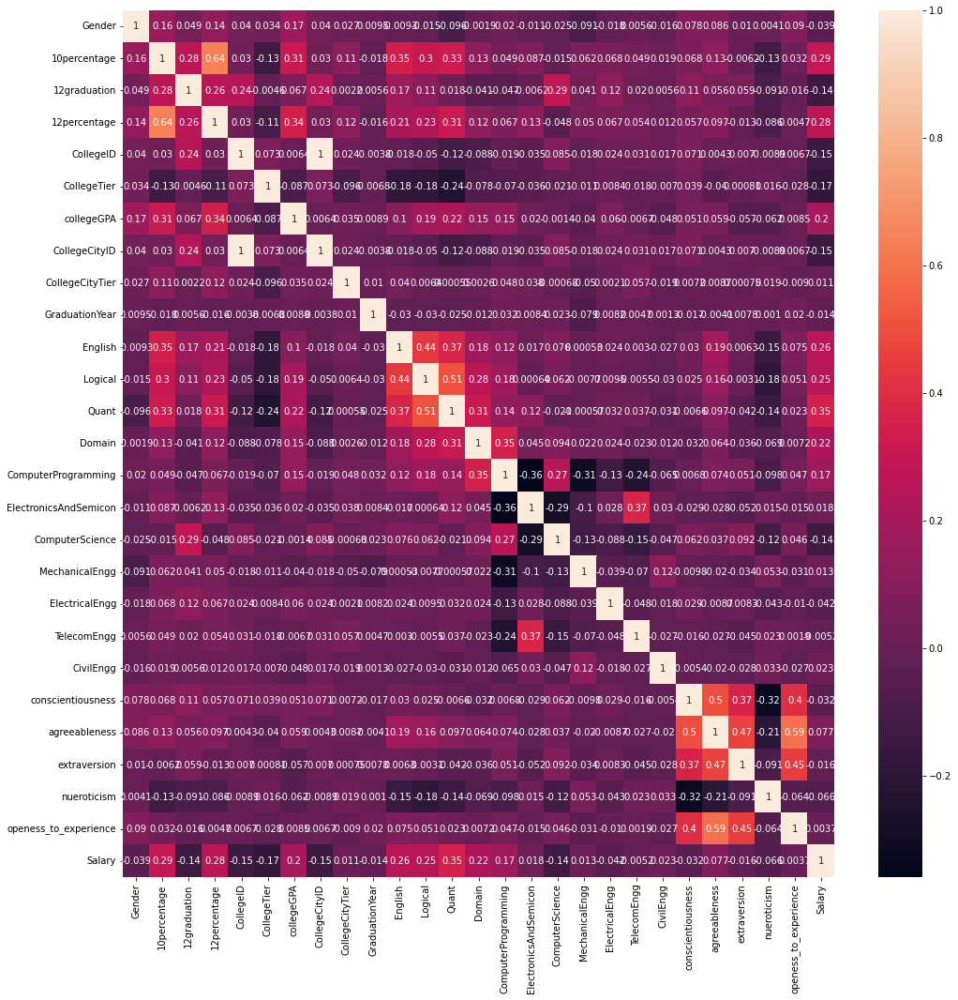

In [61]:
plt.figure(figsize = (17,17))
ax=sns.heatmap(data.corr(),annot=True)

#FITTING LINEAR REGRESSION

In [62]:
data.drop(['CollegeID', '10board','12graduation','12board' ,'CollegeCityID','CollegeState', 'CollegeCityTier','DOB'], axis = 1, inplace = True)

/usr/local/lib/python3.8/dist-packages/pandas/core/frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [63]:
data = pd.get_dummies(data, columns=["Degree"])

In [64]:
data = pd.get_dummies(data, columns=["Specialization"])

In [65]:
lm = smf.ols(formula='Salary ~ English+Logical+Quant+Domain+ElectronicsAndSemicon+ComputerScience+ElectricalEngg+TelecomEngg+conscientiousness+agreeableness+extraversion+nueroticism +openess_to_experience ', data=data).fit()
lm.params

Intercept                32292.131778
English                    164.260956
Logical                     54.719183
Quant                      253.756115
Domain                   53898.963712
ElectronicsAndSemicon      -50.922298
ComputerScience           -131.548069
ElectricalEngg            -104.226655
TelecomEngg                -21.445066
conscientiousness        -5680.100971
agreeableness             5471.412020
extraversion              2218.005698
nueroticism              -3194.104614
openess_to_experience    -2923.297539
dtype: float64

In [66]:
data.head()

,Gender,10percentage,12percentage,CollegeTier,collegeGPA,GraduationYear,English,Logical,Quant,Domain,...,Specialization_information technology,Specialization_instrumentation and control engineering,Specialization_instrumentation engineering,Specialization_mechanical & production engineering,Specialization_mechanical and automation,Specialization_mechanical engineering,Specialization_mechatronics,Specialization_metallurgical engineering,Specialization_other,Specialization_telecommunication engineering
ID,,,,,,,,,,,,,,,,,,,,,
604399,1,87.80,84.00,1,73.82,2013,650,665,810,0.694479,...,0,1,0,0,0,0,0,0,0,0
988334,0,57.00,64.50,2,65.00,2014,440,435,210,0.342315,...,0,0,0,0,0,0,0,0,0,0
301647,0,77.33,85.17,2,61.94,2011,485,475,505,0.824666,...,0,0,0,0,0,0,0,0,0,0
582313,0,84.30,86.00,1,80.40,2013,675,620,635,0.990009,...,0,0,0,0,0,0,0,0,0,0
339001,1,82.00,75.00,2,64.30,2012,575,495,365,0.278457,...,0,0,0,0,0,0,0,0,0,0


In [67]:
data.shape

(2917, 69)

In [68]:
data.isnull().sum()

Gender                                          0
10percentage                                    0
12percentage                                    0
CollegeTier                                     0
collegeGPA                                      0
                                               ..
Specialization_mechanical engineering           0
Specialization_mechatronics                     0
Specialization_metallurgical engineering        0
Specialization_other                            0
Specialization_telecommunication engineering    0
Length: 69, dtype: int64

In [69]:
X = data.drop('Salary',axis=1)
y = data['Salary']

##K-Fold cross validation

In [70]:
from sklearn.model_selection import cross_val_score,KFold,ShuffleSplit

linreg=LinearRegression()
cv = KFold(n_splits=5, random_state=0, shuffle=True)

In [71]:
scores = cross_val_score(linreg, X, y, scoring='neg_mean_absolute_error')

In [72]:
from numpy import mean
from numpy import absolute

mean(absolute(scores))


101395.40840217276

##Train-test

###Model-1

In [73]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=50)

In [74]:
lm1=LinearRegression()   
lm1.fit(X_train,y_train)

LinearRegression()

In [75]:
y_pred = lm1.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,y_pred)))
print(r2_score(y_test,y_pred))

108527.01459024395
0.28010848888330375


In [76]:
print(lm1.intercept_)
print(lm1.coef_)

-44828.1904264788
[-2.55297972e+04  1.35638201e+03  9.42852397e+02 -3.84313723e+04
  1.37177410e+03  4.06588361e+00  1.07423722e+02  2.44181607e+01
  1.87756861e+02  2.74622109e+04  3.98885691e+01  3.49899839e+00
 -1.17158522e+02  3.05923403e+01 -1.30731756e+02 -9.40317905e+00
  3.66899868e+02 -1.63865528e+03  5.71955396e+02  1.90475695e+03
 -3.08210304e+03 -2.26884051e+02 -7.11035159e+04  4.12224155e+04
 -9.08293569e+04  1.20710457e+05 -9.54359744e+04 -5.06478850e+04
 -3.00037379e+04  8.82940122e+04 -1.00448049e+04  2.72848411e-11
 -2.08365355e+04 -1.22928654e+05 -4.00177669e-11 -1.78707762e+05
  4.81871128e+04  2.68569899e+05  1.11742586e+04  3.48725097e+04
 -1.60537256e+04 -9.73655323e+04  3.56404021e+04 -1.63319113e+05
  3.62059068e+04  2.71995260e+04  3.16447721e+03  7.17812370e+03
  1.53385331e+04 -2.41060775e+04  2.36686787e+04  2.54571180e+02
  3.18323146e-11  1.04715048e+05  1.07737038e+05  9.97149692e+04
  4.12224155e+04  3.57226578e+04  3.15399783e+04  5.12370618e+04
 -2.384

In [77]:
mae=metrics.mean_absolute_error(y_test,y_pred)
mae

87295.00884421119

###Model-2

In [78]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=50)

In [79]:
lm2=LinearRegression()   
lm2.fit(X_train,y_train)

LinearRegression()

In [80]:
y_pred = lm2.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,y_pred)))
print(r2_score(y_test,y_pred))

110976.1758412874
0.25440393031664554


In [81]:
mae=metrics.mean_absolute_error(y_test,y_pred)
mae

89075.58990707282

In [82]:
print(lm2.intercept_)
print(lm2.coef_)

-75430.48434124864
[-2.15195622e+04  1.52312372e+03  8.93230319e+02 -3.27011423e+04
  1.23945387e+03  7.88970376e+00  9.40798342e+01  3.98321911e+01
  1.87068474e+02  2.51541866e+04  4.76365882e+01  1.88318415e+01
 -1.26364007e+02  3.42969317e+01 -1.37418745e+02 -1.20498607e+01
  3.62318809e+02 -2.47128448e+03 -3.19782198e+02  4.72310867e+03
 -2.21383739e+03 -1.18813564e+03 -7.26528030e+04  4.87435450e+04
 -9.84906251e+04  1.22399883e+05 -7.00409468e+04 -5.11893506e+03
 -2.10011887e+03 -6.17463346e+04 -1.81069891e+04 -9.82254278e-11
 -8.08570968e+03 -1.05030034e+05 -5.45696821e-11 -1.70048223e+05
  5.43961191e+04 -1.45519152e-11  2.33693699e+04  1.53284279e+04
  2.91038305e-11 -8.42861502e+04  4.94641262e+04 -1.47745119e+05
  3.88507782e+04  2.56962099e+04  1.23656902e+04  2.23621935e+04
  2.42493304e+04 -2.03902958e+04  1.55098206e+04  1.29518738e+04
  1.45519152e-11  1.10779233e+05  1.29261431e+05  1.16825891e+05
  4.87435450e+04  5.60118876e+04  4.46731388e+04  6.81918893e+04
 -1.48

###Model-3

In [83]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=50)

In [84]:
lm3=LinearRegression()   
lm3.fit(X_train,y_train)

LinearRegression()

In [85]:
y_pred = lm3.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,y_pred)))
print(r2_score(y_test,y_pred))

110181.31159021903
0.2718319212237401


In [86]:
mae=metrics.mean_absolute_error(y_test,y_pred)
mae

88040.12643388746

In [87]:
print(lm3.intercept_)
print(lm3.coef_)

-46203.4939250311
[-2.45830369e+04  1.31302356e+03  1.04905774e+03 -3.80259147e+04
  1.36657475e+03  1.44431295e+00  1.20400611e+02  2.21634559e+01
  1.83515306e+02  2.54892768e+04  4.06649099e+01  1.15710900e+01
 -1.14732167e+02  2.63207122e+01 -1.17877320e+02  5.08931374e+00
  3.02890000e+02 -3.51301692e+03  1.53285472e+03  3.29646974e+03
 -3.53153401e+03 -1.22094188e+03 -7.43670315e+04  4.31682641e+04
 -8.35821956e+04  1.14780963e+05 -9.34427688e+04 -4.96220285e+04
 -2.53455108e+04  9.19166104e+04 -6.24370673e+03 -7.27595761e-11
 -2.09165925e+04 -9.88601609e+04 -3.81987775e-11 -1.78542672e+05
  5.40833973e+04  2.50374942e+05  1.18932485e+04  3.53630481e+04
 -1.88800018e+04 -9.48332618e+04  2.91870072e+04 -1.71166956e+05
  2.60257206e+04  2.81492283e+04 -2.29234916e+03 -4.35322493e+04
  1.51179314e+04 -1.65432858e+04  2.26062969e+04 -8.79839498e+03
  2.67270084e+04  1.07926756e+05  1.11335614e+05  9.89114181e+04
  4.31682641e+04  3.26764272e+04  3.44942123e+04  5.07749461e+04
 -2.288

###Model-4

In [88]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=50)

In [89]:
lm4=LinearRegression()   
lm4.fit(X_train,y_train)

LinearRegression()

In [90]:
y_pred = lm4.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,y_pred)))
print(r2_score(y_test,y_pred))

112270.31990916353
0.24882583181284268


In [91]:
mae=metrics.mean_absolute_error(y_test,y_pred)
mae

89705.10610660515

In [92]:
print(lm4.intercept_)
print(lm4.coef_)

-74645.50834936608
[-2.27001504e+04  1.56273373e+03  9.85362003e+02 -3.45522775e+04
  1.03260971e+03  8.82570691e+00  9.65305222e+01  2.04231331e+01
  1.86672997e+02  2.80736420e+04  4.86015743e+01  1.06542521e+01
 -1.24733209e+02 -2.67233228e+01 -1.24134378e+02 -8.21566256e+00
  4.43951941e+02 -2.81703361e+03  6.66507050e+02  3.86270091e+03
 -4.20961987e+03 -2.90185405e+03 -5.44013662e+04 -5.09317033e-11
 -8.81026588e+04  1.42504025e+05 -5.24170965e+04 -8.74712670e+03
  2.12150768e+04 -6.66291712e+04 -1.18153975e+04 -9.45874490e-11
  1.39227354e+04 -1.29096745e+05  1.81898940e-12 -1.76836129e+05
  4.43402334e+04 -5.82076609e-11  1.97903122e+04  5.40234284e+03
 -4.36557457e-11 -8.99387309e+04  6.08605284e+04 -1.43225773e+05
  3.69841250e+04  1.68527712e+04  1.14211313e+04  1.35661532e+04
  1.38566692e+04 -2.88611417e+03  9.40101246e+03  2.42044911e+04
 -7.27595761e-12  1.04999690e+05  1.46223751e+05  1.05860309e+05
 -7.27595761e-12  4.82622454e+04  3.89910230e+04  6.03558263e+04
 -4.29

###Model-5

In [93]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=50)

In [94]:
lm5=LinearRegression()   
lm5.fit(X_train,y_train)

LinearRegression()

In [95]:
y_pred = lm5.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,y_pred)))
print(r2_score(y_test,y_pred))

109417.87713229061
0.26596206325639016


In [96]:
mae=metrics.mean_absolute_error(y_test,y_pred)
mae

87876.93592396312

In [97]:
print(lm5.intercept_)
print(lm5.coef_)

-67803.49291376706
[-2.36515139e+04  1.47211977e+03  9.50171092e+02 -3.54403538e+04
  1.32193549e+03  7.13512727e+00  1.00161169e+02  2.99095417e+01
  1.91254017e+02  2.68968648e+04  4.38429240e+01  9.79174393e+00
 -1.22662551e+02  3.24355183e+01 -1.41048554e+02  4.18043984e-02
  3.67400844e+02 -1.43557638e+03  7.92703088e+01  2.21833429e+03
 -2.75588609e+03 -3.45727126e+02 -7.51545380e+04  4.38733257e+04
 -8.94963425e+04  1.20777555e+05 -8.91768891e+04 -4.54450463e+04
 -6.63281590e+03  9.70717991e+04 -2.99383860e+03 -1.86446414e-11
 -1.26960784e+04 -1.04557777e+05  4.00177669e-11 -1.72785380e+05
  5.19899589e+04  1.45519152e-11  1.92996467e+04  4.20749557e+04
 -4.36557457e-11 -9.09610681e+04  4.30333982e+04 -1.60311637e+05
  3.22205775e+04  3.05977094e+04  8.57986972e+03  1.47880476e+04
  2.19292122e+04 -1.88840355e+04  2.99160723e+04  1.24329783e+03
  0.00000000e+00  1.11765497e+05  1.22407468e+05  1.08748176e+05
  4.38733257e+04  4.28767235e+04  4.09500689e+04  4.35763158e+04
 -1.64

#NEURAL NETWORK

##ADAM

In [98]:
import tensorflow as tf
tf.random.set_seed(50)
model= tf.keras.Sequential([
                            tf.keras.layers.Dense(50),
                            tf.keras.layers.Dense(40),
                            tf.keras.layers.Dense(30),
                            tf.keras.layers.Dense(20),
                            tf.keras.layers.Dense(10),
                            tf.keras.layers.Dense(5),
                            tf.keras.layers.Dense(1)
])

In [99]:
model.compile(loss= tf.keras.losses.mae,
              optimizer= tf.keras.optimizers.Adam(),
              metrics= ["mae"])

In [100]:
history= model.fit(X_train, y_train, epochs= 500, verbose=0)

In [101]:
model.evaluate(X_test, y_test)

23/23 [==============================] - 0s 1ms/step - loss: 87356.2734 - mae: 87356.2734


[87356.2734375, 87356.2734375]

Text(0.5, 0, 'epochs')

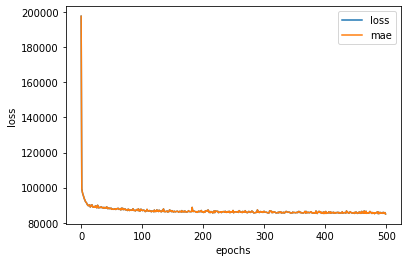

In [102]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [103]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 50)                3450      
                                                                 
 dense_1 (Dense)             (None, 40)                2040      
                                                                 
 dense_2 (Dense)             (None, 30)                1230      
                                                                 
 dense_3 (Dense)             (None, 20)                620       
                                                                 
 dense_4 (Dense)             (None, 10)                210       
                                                                 
 dense_5 (Dense)             (None, 5)                 55        
                                                                 
 dense_6 (Dense)             (None, 1)                 6

##SGD

In [104]:
import tensorflow as tf
tf.random.set_seed(50)
model1= tf.keras.Sequential([
                            tf.keras.layers.Dense(50),
                            tf.keras.layers.Dense(40),
                            tf.keras.layers.Dense(30),
                            tf.keras.layers.Dense(20),
                            tf.keras.layers.Dense(10),
                            tf.keras.layers.Dense(5),
                            tf.keras.layers.Dense(1)
])

In [105]:
model1.compile(loss= tf.keras.losses.mae,
              optimizer= tf.keras.optimizers.SGD(),
              metrics= ["mae"])

In [106]:
history= model1.fit(X_train, y_train, epochs= 50, verbose=0)

In [107]:
model1.evaluate(X_test, y_test)

23/23 [==============================] - 0s 1ms/step - loss: nan - mae: nan


[nan, nan]

Text(0.5, 0, 'epochs')

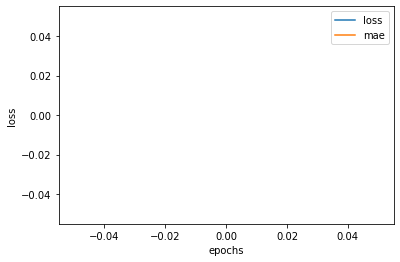

In [108]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [109]:
model1.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_7 (Dense)             (None, 50)                3450      
                                                                 
 dense_8 (Dense)             (None, 40)                2040      
                                                                 
 dense_9 (Dense)             (None, 30)                1230      
                                                                 
 dense_10 (Dense)            (None, 20)                620       
                                                                 
 dense_11 (Dense)            (None, 10)                210       
                                                                 
 dense_12 (Dense)            (None, 5)                 55        
                                                                 
 dense_13 (Dense)            (None, 1)                

#NEURAL NETWORK WITH DIFFERENT ARCHITECTURE AND TRAIN-TEST MODELS

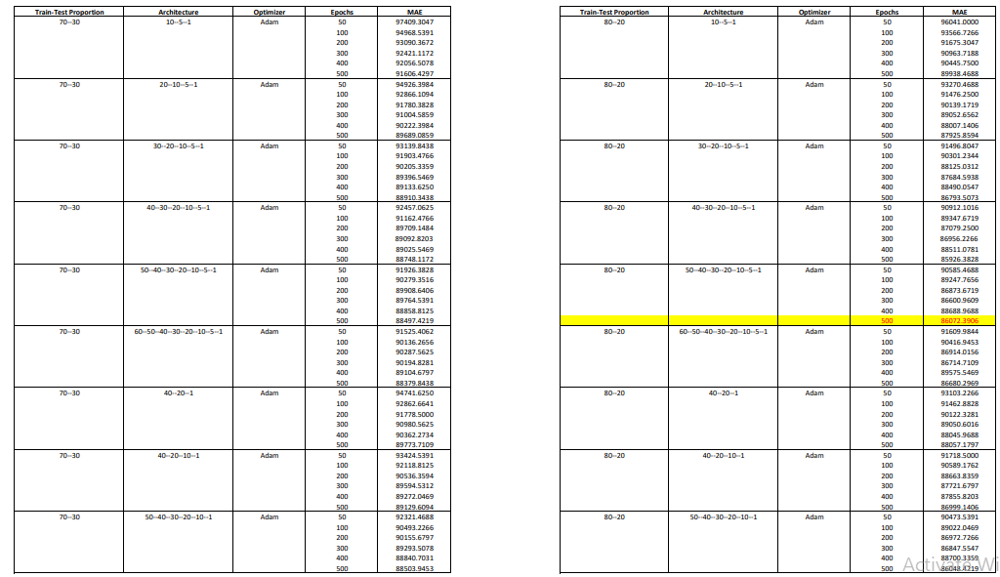

#BAGGING

In [110]:
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import BaggingRegressor

In [111]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=50)

In [112]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=50)

In [113]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=50)

In [114]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=50)

In [115]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=50)

##Bagging Regressor

In [116]:
clf = BaggingRegressor(n_estimators = 100, random_state = 0)

In [117]:
a = clf.fit(X_train, y_train)

In [118]:
mae = metrics.mean_absolute_error(y_test, a.predict(X_test))
mae

87879.0

##Decision Tree

In [119]:
from sklearn.tree import DecisionTreeRegressor

In [120]:
tree = DecisionTreeRegressor(max_depth=3, random_state=50)

In [121]:
b = tree.fit(X_train, y_train)

In [122]:
mae = metrics.mean_absolute_error(y_test, b.predict(X_test))
mae

93399.3930465653

##Random Forest

In [123]:
from sklearn.ensemble import RandomForestRegressor

In [124]:
rf = RandomForestRegressor(n_estimators = 100, random_state = 40)

In [125]:
c = rf.fit(X_train, y_train)

In [126]:
mae = metrics.mean_absolute_error(y_test, c.predict(X_test))
mae

87550.38356164383

#BOOSTING

##Ada Boost

In [127]:
from sklearn.ensemble import AdaBoostRegressor

adaboost = AdaBoostRegressor(n_estimators=500, learning_rate=0.01, random_state=0)

In [128]:
d = adaboost.fit(X_train, y_train)

In [129]:
mae = metrics.mean_absolute_error(y_test, d.predict(X_test))
mae

89651.41289036917

##GBM(Gradient Boosting Machine)

In [130]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=50)

In [131]:
from sklearn.ensemble import GradientBoostingRegressor

grad_boost= GradientBoostingRegressor(max_depth=5,learning_rate=0.01,random_state=0,n_estimators=1000)


In [132]:
e = grad_boost.fit(X_train, y_train)

In [133]:
mae = metrics.mean_absolute_error(y_test, e.predict(X_test))
mae

83447.8681144048

##XGBoost

In [134]:
import xgboost as xgb
from xgboost import XGBRegressor
xgb_boost=xgb.XGBRegressor(random_state=50,learning_rate=0.01,n_estimators=700)

In [135]:
f = xgb_boost.fit(X_train, y_train)

[16:17:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [136]:
mae = metrics.mean_absolute_error(y_test, f.predict(X_test))
mae

83556.74272260274